# Mostafa Mohamed Nabil 20200548
# Joeshwoa George 20200131

In [2]:
import numpy as np
import tensorflow as tf
import keras
import cv2
from keras.preprocessing.image import img_to_array
import os
from tqdm import tqdm
import re
import matplotlib.pyplot as plt
# Model Viz
from tensorflow.keras.utils import plot_model
from tensorflow.keras.models import load_model, save_model
from keras import layers

/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.24.3
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


In [3]:
# to get the files in proper order
def sorted_alphanumeric(data):  
    convert = lambda text: int(text) if text.isdigit() else text.lower()
    alphanum_key = lambda key: [convert(c) for c in re.split('([0-9]+)',key)]
    return sorted(data,key = alphanum_key)
# defining the size of the image
SIZE = 160
color_img = []
path1 = '/kaggle/input/landscape-image-colorization/landscape Images/color'
files_c = os.listdir(path1)
files_c = sorted_alphanumeric(files_c)
for i in tqdm(files_c):    
        
    imgc= cv2.imread(path1 + '/'+i,1)
    # open cv reads images in BGR format so we have to convert it to RGB
    imgc = cv2.cvtColor(imgc, cv2.COLOR_BGR2RGB)
    #resizing image
    imgc = cv2.resize(imgc, (SIZE, SIZE))
    imgc = imgc.astype('float32') / 255.0
    color_img.append(img_to_array(imgc))


gray_img = []
path2 = '/kaggle/input/landscape-image-colorization/landscape Images/gray/'
files_g = os.listdir(path2)
files_g = sorted_alphanumeric(files_g)
for i in tqdm(files_g):
 
    imgg = cv2.imread(path2 + '/'+i,1)

    #resizing image
    imgg = cv2.resize(imgg, (SIZE, SIZE))
    imgg = imgg.astype('float32') / 255.0
    gray_img.append(img_to_array(imgg))
     

 84%|████████▍ | 6000/7129 [00:57<00:10, 105.13it/s]


In [4]:
# defining function to plot images pair
def plot_images(color,grayscale):
    plt.figure(figsize=(15,15))
    plt.subplot(1,3,1)
    plt.title('Color Image', color = 'green', fontsize = 20)
    plt.imshow(color)
    plt.subplot(1,3,2)
    plt.title('Grayscale Image ', color = 'black', fontsize = 20)
    plt.imshow(grayscale)
   
    plt.show()

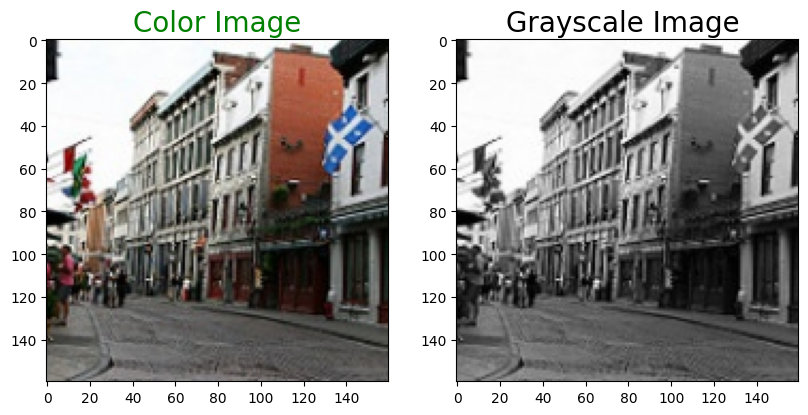

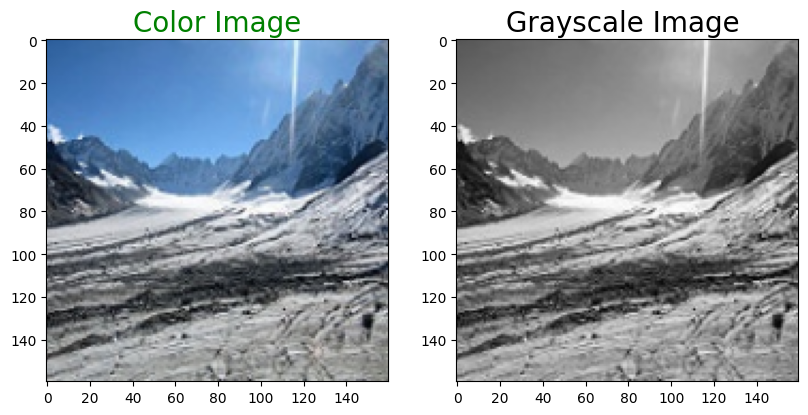

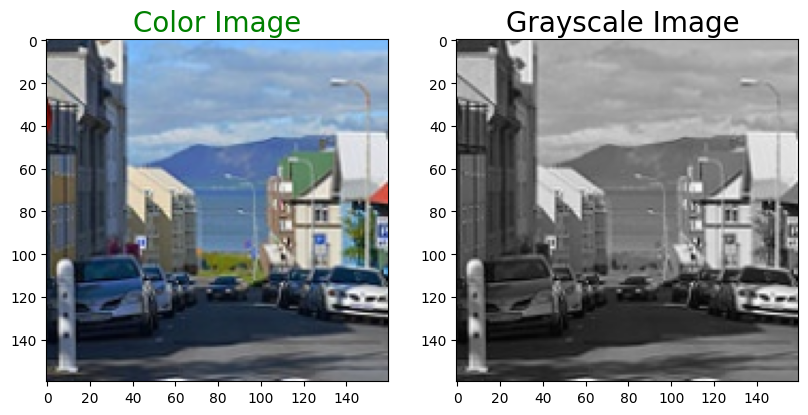

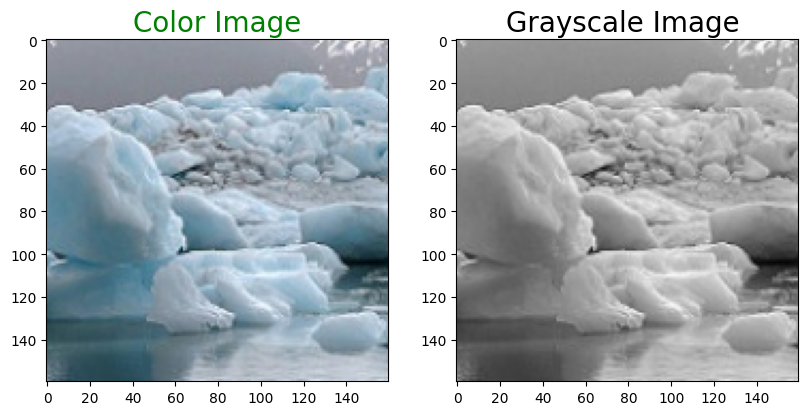

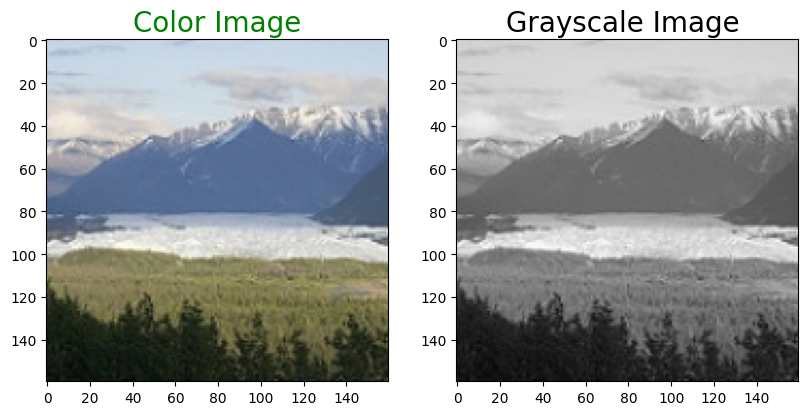

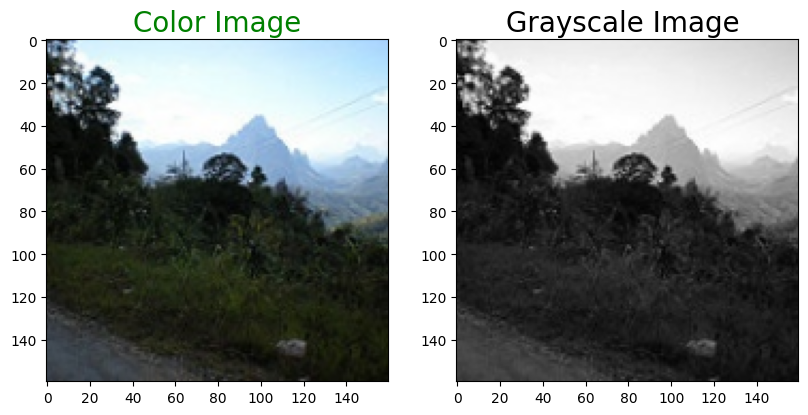

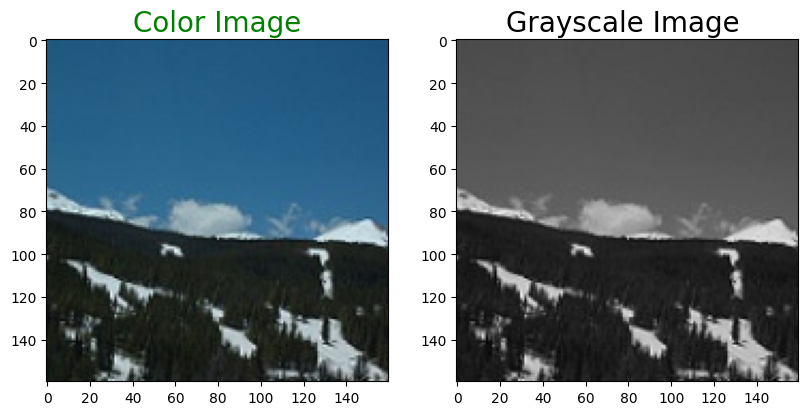

In [5]:
for i in range(3,10):
     plot_images(color_img[i],gray_img[i])

In [6]:
train_gray_image = gray_img[:5500]
train_color_image = color_img[:5500]

test_gray_image = gray_img[5500:]
test_color_image = color_img[5500:]
# reshaping
train_g = np.reshape(train_gray_image,(len(train_gray_image),SIZE,SIZE,3))
train_c = np.reshape(train_color_image, (len(train_color_image),SIZE,SIZE,3))
print('Train color image shape:',train_c.shape)


test_gray_image = np.reshape(test_gray_image,(len(test_gray_image),SIZE,SIZE,3))
test_color_image = np.reshape(test_color_image, (len(test_color_image),SIZE,SIZE,3))
print('Test color image shape',test_color_image.shape)

Train color image shape: (5500, 160, 160, 3)
Test color image shape (500, 160, 160, 3)


In [7]:
inputs = layers.Input(shape= [160,160,3])
# encoder 
e1=layers.Conv2D(128,(3,3),padding = 'same', strides = 2)(inputs)
ea1=keras.layers.LeakyReLU()(e1)

e2=layers.Conv2D(128,(3,3),padding = 'same', strides = 2)(ea1)
ea2=keras.layers.LeakyReLU()(e2)

e3=layers.Conv2D(256,(3,3),padding = 'same', strides = 2)(ea2)
bn3=layers.BatchNormalization()(e3)
ea3=keras.layers.LeakyReLU()(bn3)

e4=layers.Conv2D(512,(3,3),padding = 'same', strides = 2)(ea3)
bn4=layers.BatchNormalization()(e4)
ea4=keras.layers.LeakyReLU()(bn4)

e5=layers.Conv2D(512,(3,3),padding = 'same', strides = 2)(ea4)
bn5=layers.BatchNormalization()(e5)
ea5=keras.layers.LeakyReLU()(bn5)

#decoder
#decoder layer 1
d1=layers.Conv2DTranspose(512,(3,3),padding = 'same', strides = 2)(ea5)
da1=keras.layers.LeakyReLU()(d1)

da1=layers.concatenate([da1,ea4])
#decoder layer 2
d2=layers.Conv2DTranspose(256,(3,3),padding = 'same', strides = 2)(da1)
da2=keras.layers.LeakyReLU()(d2)

da2=layers.concatenate([da2,ea3])
#decoder layer 3
d3=layers.Conv2DTranspose(128,(3,3),padding = 'same', strides = 2)(da2)
da3=keras.layers.LeakyReLU()(d3)

da3=layers.concatenate([da3,ea2])
#decoder layer 4
d4=layers.Conv2DTranspose(128,(3,3),padding = 'same', strides = 2)(da3)
da4=keras.layers.LeakyReLU()(d4)

da4=layers.concatenate([da4,ea1])
#decoder layer 5
d5=layers.Conv2DTranspose(3,(3,3),padding = 'same', strides = 2)(da4)
da5=keras.layers.LeakyReLU()(d5)

da5=layers.concatenate([da5,inputs])

output = layers.Conv2D(3,(2,2),strides = 1, padding = 'same')(da5)

model=tf.keras.Model(inputs=inputs, outputs=output)
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 160, 160, 3)]        0         []                            
                                                                                                  
 conv2d (Conv2D)             (None, 80, 80, 128)          3584      ['input_1[0][0]']             
                                                                                                  
 leaky_re_lu (LeakyReLU)     (None, 80, 80, 128)          0         ['conv2d[0][0]']              
                                                                                                  
 conv2d_1 (Conv2D)           (None, 40, 40, 128)          147584    ['leaky_re_lu[0][0]']         
                                                                                              

In [8]:
model.compile(optimizer = tf.keras.optimizers.Adam(learning_rate = 0.001), loss = 'mean_absolute_error', metrics = ['acc'])
model.fit(train_g, train_c, epochs = 250,batch_size = 250,verbose=True)


Epoch 1/250
22/22 [==============================] - 31s 597ms/step - loss: 0.1906 - acc: 0.2893
Epoch 2/250
22/22 [==============================] - 13s 598ms/step - loss: 0.0865 - acc: 0.3514
Epoch 3/250
22/22 [==============================] - 13s 600ms/step - loss: 0.0783 - acc: 0.3927
Epoch 4/250
22/22 [==============================] - 13s 604ms/step - loss: 0.0730 - acc: 0.4243
Epoch 5/250
22/22 [==============================] - 13s 603ms/step - loss: 0.0681 - acc: 0.4477
Epoch 6/250
22/22 [==============================] - 13s 606ms/step - loss: 0.0642 - acc: 0.4667
Epoch 7/250
22/22 [==============================] - 13s 605ms/step - loss: 0.0620 - acc: 0.4772
Epoch 8/250
22/22 [==============================] - 13s 603ms/step - loss: 0.0600 - acc: 0.4849
Epoch 9/250
22/22 [==============================] - 13s 604ms/step - loss: 0.0591 - acc: 0.4899
Epoch 10/250
22/22 [==============================] - 13s 608ms/step - loss: 0.0578 - acc: 0.4910
Epoch 11/250
22/22 [=========

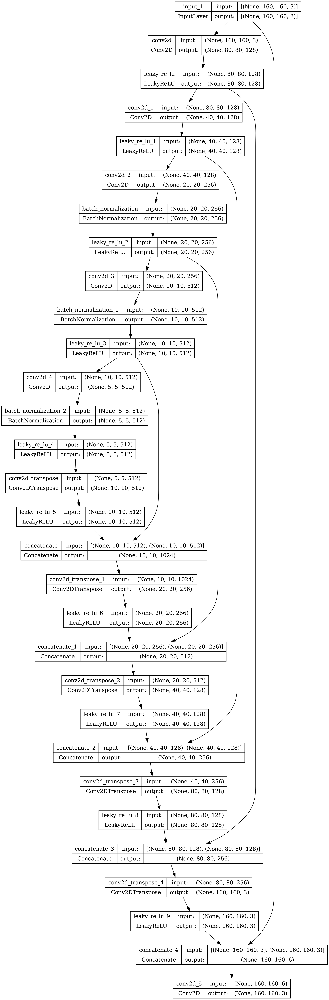

In [9]:
plot_model(model, "imageColorization.png",show_shapes=True, expand_nested=True, dpi=256)

In [10]:
model.evaluate(test_gray_image,test_color_image)

16/16 [==============================] - 1s 49ms/step - loss: 0.0497 - acc: 0.5252


[0.04969168081879616, 0.5252357721328735]

1/1 [==============================] - 0s 20ms/step


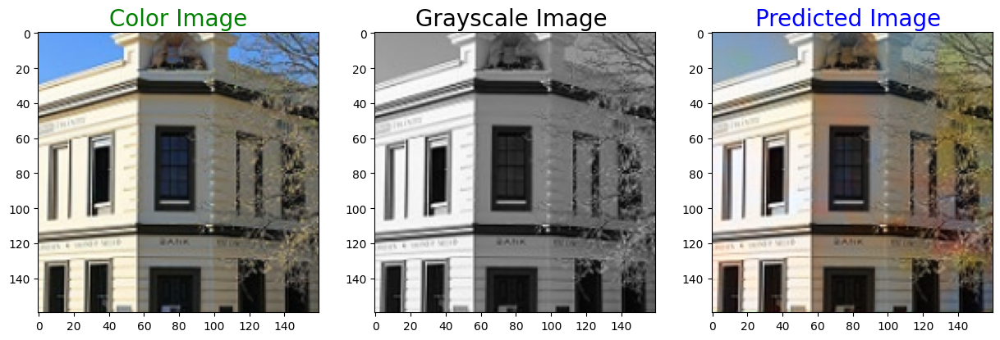

1/1 [==============================] - 0s 20ms/step


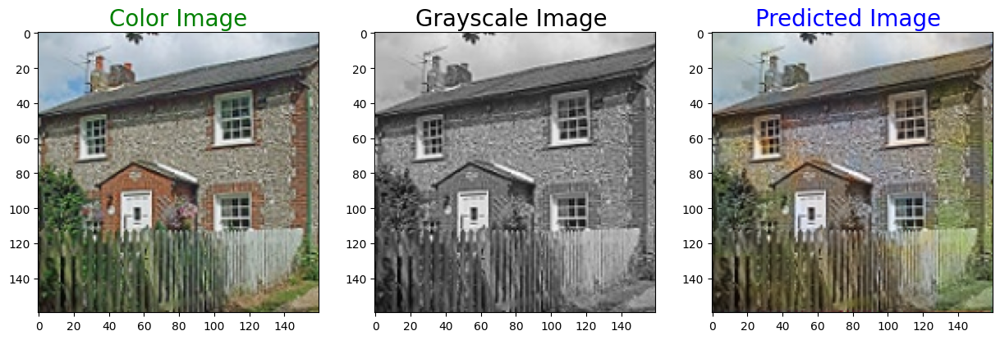

1/1 [==============================] - 0s 20ms/step


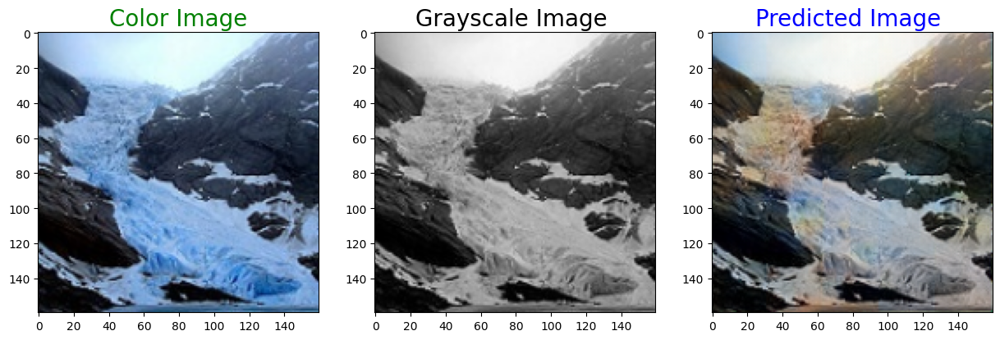

1/1 [==============================] - 0s 19ms/step


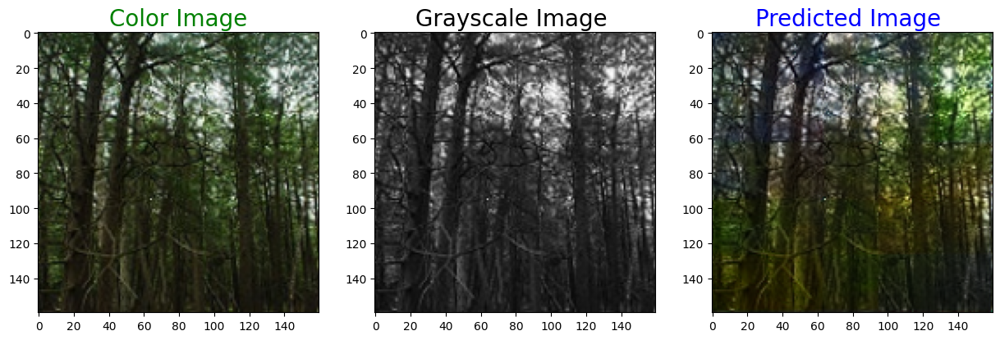

1/1 [==============================] - 0s 20ms/step


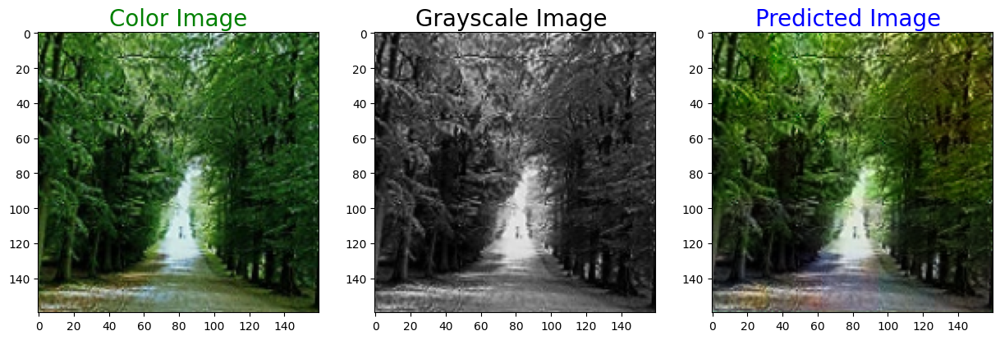

1/1 [==============================] - 0s 19ms/step


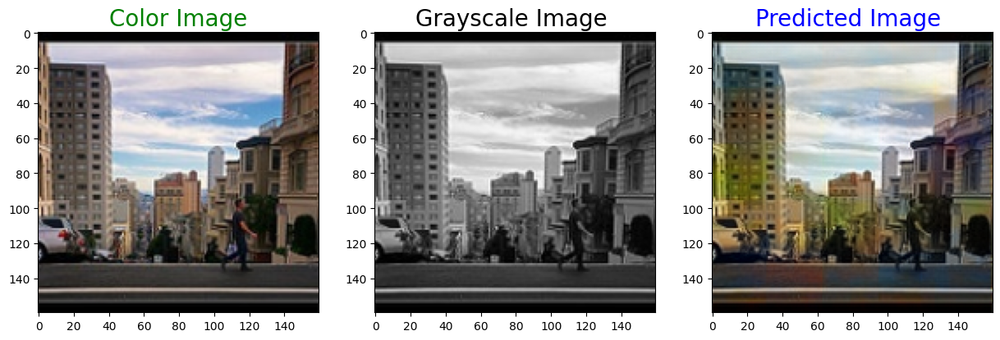

1/1 [==============================] - 0s 19ms/step


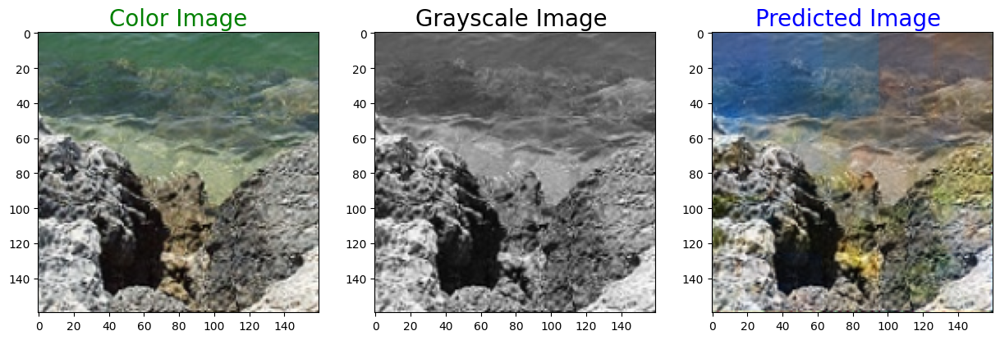

1/1 [==============================] - 0s 19ms/step


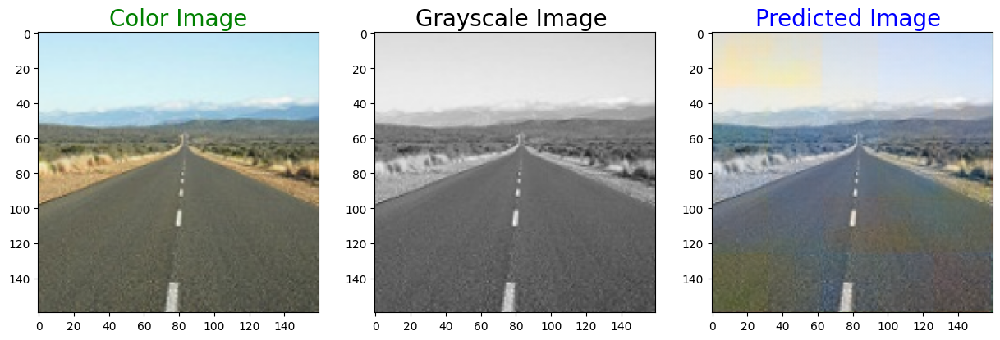

1/1 [==============================] - 0s 18ms/step


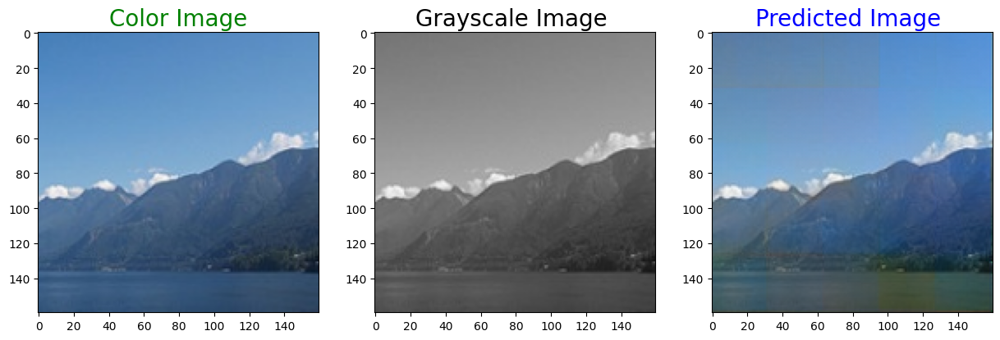

1/1 [==============================] - 0s 19ms/step


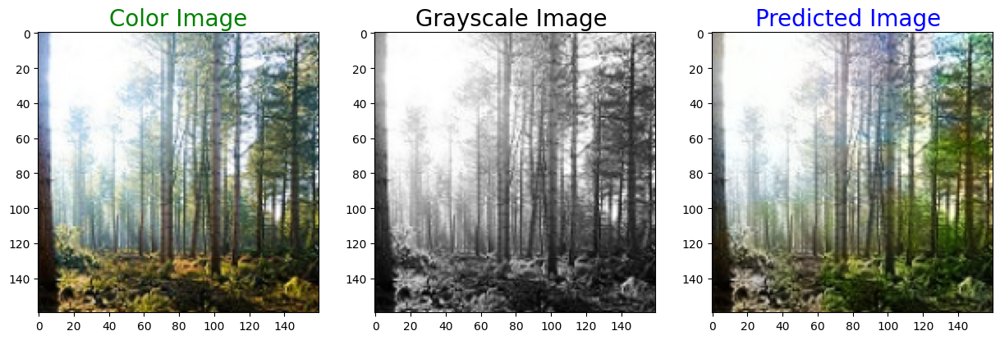

In [26]:
# defining function to plot images pair
def plot_images(color,grayscale,predicted):
    plt.figure(figsize=(15,15))
    plt.subplot(1,3,1)
    plt.title('Color Image', color = 'green', fontsize = 20)
    plt.imshow(color)
    plt.subplot(1,3,2)
    plt.title('Grayscale Image ', color = 'black', fontsize = 20)
    plt.imshow(grayscale)
    plt.subplot(1,3,3)
    plt.title('Predicted Image ', color = 'blue', fontsize = 20)
    plt.imshow(predicted)
   
    plt.show()

for i in range(47,57):
    predicted = np.clip(model.predict(test_gray_image[i].reshape(1,SIZE, SIZE,3)),0.0,1.0).reshape(SIZE, SIZE,3)
    plot_images(test_color_image[i],test_gray_image[i],predicted)


In [12]:
# Assuming 'model' is your TensorFlow model
# Example: Save the entire model to a file
model.save('/kaggle/working/image_colorization_model_from_scratch_250.model')

In [13]:
import os
import subprocess
from IPython.display import FileLink, display

def download_file(path, download_file_name):
    os.chdir('/kaggle/working/')
    zip_name = f"/kaggle/working/{download_file_name}.zip"
    command = f"zip {zip_name} {path} -r"
    result = subprocess.run(command, shell=True, capture_output=True, text=True)
    if result.returncode != 0:
        print("Unable to run zip command!")
        print(result.stderr)
        return
    display(FileLink(f'{download_file_name}.zip'))

In [14]:
download_file('/kaggle/working/image_colorization_model_from_scratch_250.model', 'image_colorization_model_from_scratch_250.model')

/kaggle/working/image_colorization_model_from_scratch_250.model.zip